# **DEEP LEARNING FINAL PROJECT**


### RON KEINAN 203735857






____________________________________________________________________________________________________________________________________________________________________________________

## Part 03 - Implementation of Simplified Graph Convolutions (SGC) as a logistic regression

# Node classification with Simplified Graph Convolutions (SGC)

This notebook demonstrates the use of `StellarGraph`'s GCN , class for training the simplified graph convolution (SGC) model.

We show how to use `StellarGraph` to perform node attribute inference on the Cora citation network using SGC by creating a single layer GCN model with softmax activation.

SGC simplifies GCN in the following ways,

 - It removes the non-linearities in the graph convolutional layers.
 - It smooths the node input features using powers of the normalized adjacency matrix with self loops.
 - It uses a single softmax layer such that GCN is simplified to logistic regression on smoothed node features.

For a graph with $N$ nodes, $F$-dimensional node features and $C$ number of classes, SGC simplifies GCN using the following logistic regression classifier with smoothed features,

$\hat{\boldsymbol{Y}}_{SGC} = \mathtt{softmax}(\boldsymbol{S}^K \boldsymbol{X}\; \boldsymbol{\Theta})$

where $\hat{\boldsymbol{Y}}_{SGC} \in \mathbb{R}^{N\times C}$ are the class predictions; $\boldsymbol{S}^K \in \mathbb{R}^{N\times N}$ is the normalised graph adjacency matrix with self loops raised to the K-th power; $\boldsymbol{X}\in \mathbb{R}^{N\times F}$ are the node input features; and $\boldsymbol{\Theta} \in \mathbb{R}^{F\times C}$ are the classifier's parameters to be learned.


In [2]:
  %pip install -q stellargraph[demos]==1.2.1
  import stellargraph as sg

     |████████████████████████████████| 435 kB 6.3 MB/s 
     |████████████████████████████████| 482 kB 38.8 MB/s 
     |████████████████████████████████| 41 kB 526 kB/s 


In [ ]:
import pandas as pd
import os

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import pandas as pd
import numpy as np
import scipy.sparse as sp

from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

import stellargraph as sg
from stellargraph.mapper import FullBatchNodeGenerator
from stellargraph.layer import GCN
from stellargraph import datasets

from tensorflow.keras import layers, optimizers, losses, metrics, Model, regularizers
from IPython.display import display, HTML
import matplotlib.pyplot as plt
%matplotlib inline

## Loading the network


In [ ]:
!pip3 install pickle5
import pickle5 as pickle

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 256 kB 18.1 MB/s 


In [ ]:
with open('user_adjacency_matrix.pkl', "rb") as fh:
  adj_mat = pickle.load(fh)
with open('user_feature_matrix.pkl', "rb") as fh:
  feature_mat = pickle.load(fh)
with open('node_subjects_41.pkl', "rb") as fh:
  node_subjects_dict = pickle.load(fh)
users_list = list(feature_mat.keys())

In [ ]:
adj_mat

,משה מיכאלי,אורנה יריב,אייליקו,יובל190,לירי90,Dblonder,דניאל321,עמיק,איציק חיים,דנה צינמן ליטרט,...,נועם21,ספיר בו ארי,שנשן1,Romi weinberg,spring1,shir6,Elad29,חזימק,dave the brave,איריי
משה מיכאלי,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
אורנה יריב,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
אייליקו,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
יובל190,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
לירי90,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
shir6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Elad29,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
חזימק,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
dave the brave,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
feature_mat

{'לביא שיפמן': array([-0.07936312,  0.1776539 , -0.01359404,  0.05254431, -0.03081165,
        -0.04211425, -0.01193466,  0.08848834, -0.00110687, -0.11825657,
         0.03150761, -0.00648487,  0.12834977, -0.06143375, -0.12099311,
        -0.08854195,  0.0277814 , -0.01954424,  0.06356154,  0.01121283,
         0.02532799, -0.0728427 , -0.017835  , -0.01340876,  0.11070614,
         0.05724833, -0.07006899, -0.05176855, -0.06446061, -0.07465386,
        -0.04455044,  0.01811862, -0.04047392,  0.10020394,  0.04148131,
        -0.00747918, -0.02239763, -0.07433893,  0.06934176, -0.04096877,
        -0.03097013,  0.00926556,  0.01429047, -0.08569276, -0.03673668,
         0.05175055, -0.04321851,  0.04402405, -0.02605789,  0.09270935,
        -0.02343259, -0.04153547,  0.02978357,  0.0013625 , -0.0088727 ,
         0.05060318,  0.02164865,  0.11159804, -0.05766537, -0.04967572,
        -0.02205995, -0.05520091, -0.0471925 ,  0.00307786,  0.01884732,
         0.00672168, -0.02361856,  0.

In [ ]:
node_subjects_dict

{' 1Jacob': 'גמילה מעישון',
 ' 1regev': 'קרוהן וקוליטיס',
 ' 1Shely': 'דיכאון וחרדה',
 ' Adi66': 'ער"ן - עזרה ראשונה נפשית',
 ' banana': 'הפרעות אכילה',
 " Daniel's": 'גמילה מעישון',
 ' Hby': 'כליות ודיאליזה',
 ' Hifa': 'דיכאון וחרדה',
 ' ilyv': 'דיכאון וחרדה',
 ' Jony': 'דיכאון וחרדה',
 ' Keren': 'השמנה',
 ' Lonly134': 'דיכאון וחרדה',
 ' Marinap': 'השמנה',
 ' Morantal': 'שלפוחית רגיזה',
 ' mzd1989': 'ער"ן - עזרה ראשונה נפשית',
 ' nastyaf': 'בעיות גדילה',
 ' אנונימית': 'דיכאון וחרדה',
 ' בת משי': 'גמילה מעישון',
 " ג'ק": 'דיכאון וחרדה',
 ' דונהברברה': 'זכויות החולה',
 ' דפנה': 'סוכרת סוג-2',
 ' זואי.ש': 'מחלות לב',
 ' חגי': 'כאב',
 ' יאיא': 'לחץ דם',
 ' יוחנן 14': 'דיכאון וחרדה',
 ' יעל ענת שוב': 'כאב',
 ' לורה משגב': 'סרטן השד',
 ' מוטי סונגו': 'כאב',
 ' מישהי': 'הפרעות אכילה',
 ' נטלי': 'אוסטאופורוזיס',
 ' עמי 1': 'כאב',
 ' ציפית': 'תרופות ורוקחות',
 ' רותת': 'אוסטאופורוזיס',
 ' רינת': 'תרופות ורוקחות',
 ' שם20': 'דיכאון וחרדה',
 ' תמר': 'בעיות גדילה',
 ':)': 'דיכאון וחרדה',
 '-man-'

In [ ]:
i=0
node_features = {}
for j in feature_mat.values():
  node_features[i]=j
  i += 1

In [ ]:
node_features2=pd.DataFrame.from_dict(node_features, orient='index')

In [ ]:
node_features2

,0,1,2,3,4,5,6,7,8,9,...,290,291,292,293,294,295,296,297,298,299
0,-0.079363,0.177654,-0.013594,0.052544,-0.030812,-0.042114,-0.011935,0.088488,-0.001107,-0.118257,...,0.019265,0.049476,0.068810,-0.023148,0.045549,0.078404,0.025368,-0.082066,0.046651,-0.008382
1,-0.070776,0.169057,0.012329,0.128589,-0.047977,-0.018110,-0.035483,0.098511,-0.018471,-0.122035,...,0.032617,0.100679,0.090441,-0.073167,0.080210,0.130015,0.030597,-0.058299,0.016272,-0.039827
2,-0.095276,0.197966,-0.028313,0.098326,-0.032337,-0.007141,-0.035810,0.107801,-0.018322,-0.056584,...,-0.004446,0.113650,0.050531,-0.050060,0.033171,0.114102,-0.017353,-0.097058,0.025192,-0.005947
3,-0.049663,0.136132,-0.034219,0.086193,-0.036854,0.019061,-0.007775,0.136401,-0.015352,-0.094028,...,-0.004518,0.125916,0.044492,-0.006302,0.029985,0.138440,0.008088,-0.055757,0.025885,0.036889
4,-0.018615,0.035545,-0.035801,0.040496,0.052565,-0.010191,-0.014240,0.068285,0.029324,-0.049961,...,-0.020885,0.049769,-0.031553,0.003061,0.043212,0.031985,0.001361,-0.034763,-0.009788,-0.083740
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2713,-0.049436,0.187495,0.026946,0.067266,-0.008725,-0.030464,0.008310,0.205939,0.010897,-0.101269,...,0.007408,0.132840,0.083517,-0.079354,0.065178,0.123733,-0.010950,-0.055168,0.027542,0.033386
2714,-0.550960,0.026071,1.311685,0.091568,0.379620,-0.516114,-0.056127,0.615939,0.276557,-0.152301,...,-0.360484,-0.315122,1.015355,0.429403,0.225951,0.128555,-0.063635,0.036399,-0.032223,0.211318
2715,-0.100368,0.248489,-0.062661,0.184977,-0.032892,-0.154458,-0.202165,0.121231,0.120159,-0.003449,...,-0.019587,0.184595,0.016972,0.030899,0.151649,0.019074,0.114247,-0.034741,0.115024,0.057555
2716,-0.138732,0.195776,-0.097274,-0.213478,-0.117400,-0.040885,0.119062,0.169415,0.156920,-0.224291,...,-0.048332,0.234377,0.259634,0.064330,0.117392,0.045559,0.006328,-0.037677,0.107575,0.097743


In [ ]:
import networkx as nx
from stellargraph import StellarGraph
A=np.array(adj_mat)
X=np.array(list(feature_mat.values()))
G=StellarGraph(nx.from_numpy_matrix(A), node_features=node_features2)
node_subjects=pd.Series(node_subjects_dict)
g_nx = sg.StellarDiGraph.to_networkx(G)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: DeprecationWarning: Constructing a StellarGraph directly from a NetworkX graph has been replaced by the `StellarGraph.from_networkx` function
  """


In [ ]:
print(G.info())

StellarGraph: Undirected multigraph
 Nodes: 2718, Edges: 6790

 Node types:
  default: [2718]
    Features: float32 vector, length 300
    Edge types: default-default->default

 Edge types:
    default-default->default: [6790]
        Weights: range=[1, 74], mean=1.87393, std=2.53118
        Features: none


We aim to train a graph-ML model that will predict the "subject" attribute on the nodes. These subjects are one of 7 categories:

In [ ]:
set(node_subjects)

{'nan',
 'אוסטאופורוזיס',
 'אטופיק דרמטיטיס',
 'אירוע מוחי',
 'בני משפחה מטפלים',
 'בעיות גדילה',
 'גמילה מעישון',
 'דיכאון וחרדה',
 'הידרדניטיס סופורטיבה HS',
 'הפרעות אכילה',
 'השמנה',
 'זכויות החולה',
 'חוט שדרה',
 'טראומה מטרור ומלחמה',
 'טרשת נפוצה',
 'כאב',
 'כליות ודיאליזה',
 'לחץ דם',
 'מושתלים',
 'מחלות לב',
 'מיאלומה נפוצה',
 'מפרקים',
 'ניוון מקולרי גילי (AMD)',
 'נשימה',
 'סוכרת סוג-1',
 'סוכרת סוג-2',
 'סיוגרן (sjogren)',
 'סרטן',
 'סרטן המעי הגס',
 'סרטן הריאות',
 'סרטן השד',
 'סרטן השחלות',
 'סרטן שלפוחית השתן',
 'ער"ן - עזרה ראשונה נפשית',
 'פיברומיאלגיה',
 'פסוריאזיס',
 'קדחת ים תיכונית (FMF)',
 'קרוהן וקוליטיס',
 'קשב וריכוז',
 'שלפוחית רגיזה',
 'תרופות ורוקחות'}

In [ ]:
F = G.node_features()

In [ ]:
F.shape

(2718, 300)

In [ ]:
users_and_communities = {}
for usr in users_list:
  if usr in node_subjects.keys():
    users_and_communities[usr] = node_subjects[usr]
  else:
    users_and_communities[usr] = 'nan'
users_and_communities = pd.Series(users_and_communities)

In [ ]:
nodes = list(G.nodes())
label_map = { l: i for i, l in enumerate(np.unique(node_subjects))}
y = [label_map[users_and_communities[target]] for target in users_and_communities.keys()]

#For multi-edge relations, we can propagate the node features through different adjacency matrices (with and without ego-propagation) according to the graph



*   ***X*** - Only data (without structure)
*   ***AX*** - No loop aggregation (for heterophilic graphs)
*   ***A(X+I)*** - Self-loop aggregation (for homophilic graphs)
*   You can also use powers of the aggregation to explore more hops








# Computational Representations of Message Passing



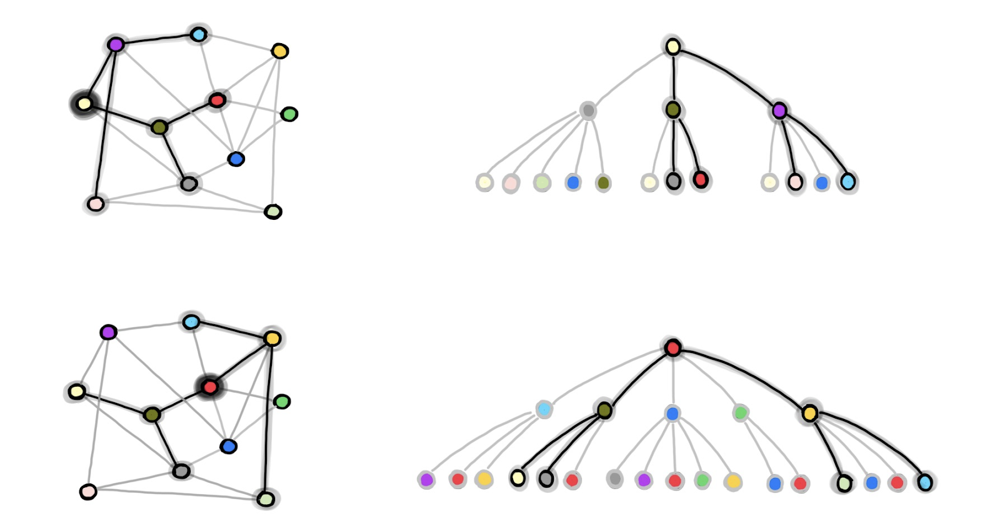

Object-Oriented Implementation

In [ ]:
def message_passing(G):
    """Object-oriented message passing operation."""

    G_new = G.copy()

    for node, data in G.nodes(data=True):
        new_value = data["value"]  # assuming the value is stored under this key
        neighbors = G.neighbors(node)
        for neighbor in neighbors:
            new_value += G.nodes[neighbor]["value"]
        G_new.node[node]["value"] = new_value
    return G

Linear Algebra Implementation

We know that every graph may be represented as an adjacency matrix A, whose shape is (n_nodes, n_nodes). As long as we maintain proper node ordering, we may also define a compatibly-shaped matrix F for node function values, whose shape is (n_nodes, n_features).

Taking advantage of this, in order define the “self plus neighbors” message passing operation in terms of linear algebra operations, we may then modify A by adding to it a diagonal matrix of ones. (In graph terminology, this is equivalent to adding a self-loop to the adjacency matrix.)

Then, message passing, as defined above, is trivially the dot product of A and F:

In [ ]:
def message_passing(A, F):
    """
    Message passing done by linear algebra.

    :param A: Adjacency-like matrix, whose shape is (n_nodes, n_nodes).
    :param F: Feature matrix, whose shape is (n_nodes, n_features).
    """

    return np.dot(A, F)

[Example](https://towardsdatascience.com/the-intuition-behind-graph-convolutions-and-message-passing-6dcd0ebf0063)

we can stack node feature vectors in a matrix X and multiply them by adjacency matrix A, then we obtain updated features X` that combine information about node closest neighbors.

So every node gets information about its closest neighbors (also called 1-hop distance). Multiplication on adjacency matrix propagates features from node to node.

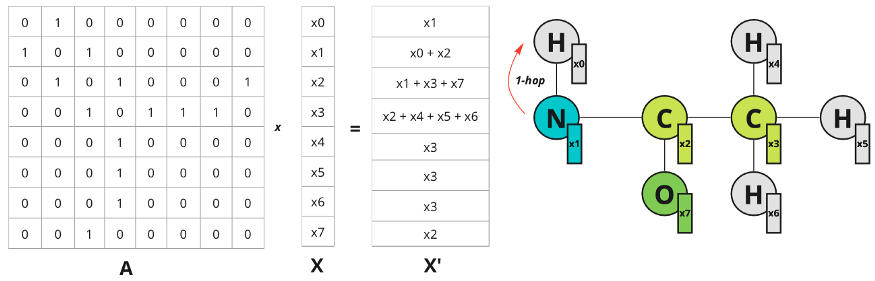

In the image domain, we can extend the receptive field by increasing the filter size. In graphs, we also can take more distant neighbors into account. If one multiplies A² by X, the information about 2-hop-distant nodes propagates to the nodes.

Higher powers of matrix A behaves in the same way: multiplication by A^n leads to propagation of features from n-hop distance nodes. So we can extend the “receptive field” by adding multiplication to higher powers of the adjacency matrix.

If one repeats the graph convolution several times, it can lead to graph over-smoothing, where every node embedding becomes the same average vector for all connected nodes.

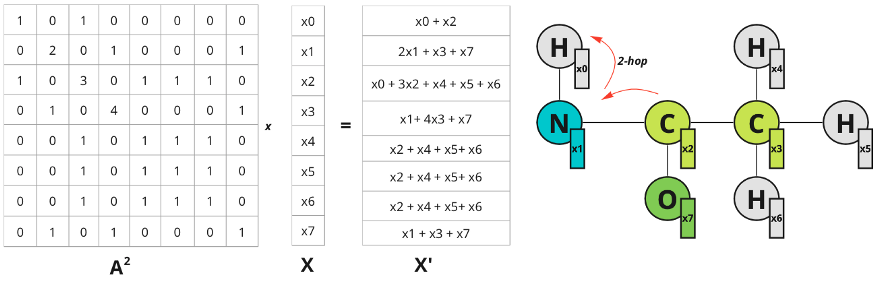

#Self-loop aggregation.

in order define the “self plus neighbors” message passing operation (**i.e. the node send a message to itself**) in terms of linear algebra operations, we may then modify A by adding to it a diagonal matrix of ones. (In graph terminology, this is equivalent to adding a self-loop to the adjacency matrix.)

So now if we multiply the graph feature matrix X by (I + A) we obtain the following:

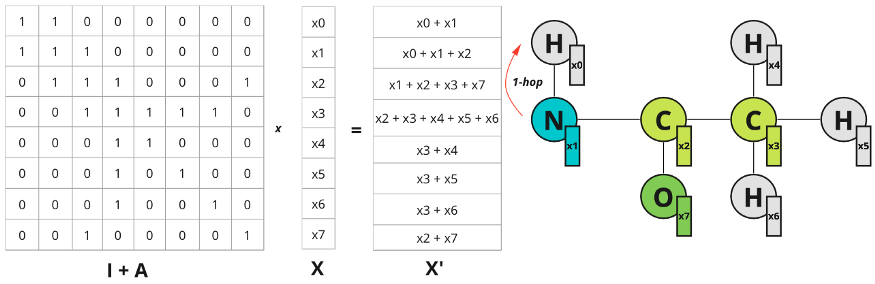

![crop1](data:application/octet-stream;base64,/9j/4AAQSkZJRgABAQAAYABgAAD/4gIoSUNDX1BST0ZJTEUAAQEAAAIYAAAAAAQwAABtbnRyUkdCIFhZWiAAAAAAAAAAAAAAAABhY3NwAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAQAA9tYAAQAAAADTLQAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAlkZXNjAAAA8AAAAHRyWFlaAAABZAAAABRnWFlaAAABeAAAABRiWFlaAAABjAAAABRyVFJDAAABoAAAAChnVFJDAAABoAAAAChiVFJDAAABoAAAACh3dHB0AAAByAAAABRjcHJ0AAAB3AAAADxtbHVjAAAAAAAAAAEAAAAMZW5VUwAAAFgAAAAcAHMAUgBHAEIAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAAFhZWiAAAAAAAABvogAAOPUAAAOQWFlaIAAAAAAAAGKZAAC3hQAAGNpYWVogAAAAAAAAJKAAAA+EAAC2z3BhcmEAAAAAAAQAAAACZmYAAPKnAAANWQAAE9AAAApbAAAAAAAAAABYWVogAAAAAAAA9tYAAQAAAADTLW1sdWMAAAAAAAAAAQAAAAxlblVTAAAAIAAAABwARwBvAG8AZwBsAGUAIABJAG4AYwAuACAAMgAwADEANv/bAEMACAYGBwYFCAcHBwkJCAoMFA0MCwsMGRITDxQdGh8eHRocHCAkLicgIiwjHBwoNyksMDE0NDQfJzk9ODI8LjM0Mv/bAEMBCQkJDAsMGA0NGDIhHCEyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMv/AABEIAToB6AMBIgACEQEDEQH/xAAbAAEAAgMBAQAAAAAAAAAAAAAABQYBAwQCB//EAE4QAAEEAgECBAMDBwgFCAsAAAEAAgMEBRESITEGE0FRFCJhMkJxFSNSYoGRsRYzVJKTocHRB1OC4fAkNDVylKLS8SUmQ0Zjg5Wys8PT/8QAGQEBAAMBAQAAAAAAAAAAAAAAAAECAwQF/8QAJhEBAQACAgICAwEAAgMAAAAAAAECEQMhEjETQQQiURQjYXGB8P/aAAwDAQACEQMRAD8A+/IiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgLVZm8itLL5b5eDC7y2Dbn6G9AepPotqwUHNjr1bJUIbtSUSQTND2OHr+I9DvoR6EaXTsKrXmnwpkp8wwkYW07lkIh2rSE/8AOG/qns8f7fo7c1ksrVxONN2w8mPo1jI/mdK53RrGD1cToAD3Qer+Tr0JqkMhc6e1KIooo28nH1c7Xo1o6k+n4kLtGvRQODxVllifMZUtdlLTePltO2VYgekLD/e4+ruvYACeHTaDKxsISoYZiW7nvydj445Iqp/5fYdstjJaeMbfd/VpP6I79SEE0CD2RYAI3tZQEREBERAREQEREBERAREQERYPUFBnYRV3NOt4a7+XK4ms1OLY79QEu1GCdSxt927Jc0faG/UDcs3I1i0OZJ5gcNtLASCPx7KZLfSNuskDudLKg8xnjVrNioxCbITnjBHJ8rW+he8+jG72ddewHcLtw9A43HMrvtzW5Nl8k8riTI9x24gdmjZOmjoBpNJ270TabHuoBFqrWoLkDZ6s0c0Lt8ZI3BzTo66EfULagIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAndarPnCtKazWPnDD5bZHFrS7XTZAJA+oChBN4v6/+jcH3/p8v/8AFBYEVMydnxCLFduVibUokOJkxMkk7jINcQ/82C1uuXbez0P120fE9rGU4W+J6U9JuvlyDgHQuHoZS3+adrW+QDd9j6LHHl8uW8er1rv6NLTOWiCQvHJgaeTdb2PZfOvCeFhdk8ZEyg+OTEMBmlkk5RnnGQwsHI9SDsdBxGx66V9tWSMbJaqxi0BEXxtY7+cGtjifr6Kr+C7fmWctZnZ5DfIquPNwPyiLo4n6gb/ap5Px5yePJbf1v1Vd96XTsCSU30VTd42pS1PNZK2HlK6NjXNL5ZTs6EUTfmeSNH2G/Xque1V8Q5qtBJNTjbjoXgux87musW26IBkcCI2EEg8OoOupHZW5vLjxtk3f4mXaVzGRtW7ZweGl4XXNDrNoDkKcZ9fYyO+63/aPQdZPFYuphsdHRpR8IY99yXOcSernE9XOJ2ST1O1WfCssGFs2sRcojFT2bLp6kZ4mOZpa3oxzehcNHbe49NgbVyHTYTiyuWEys1v6SyiIrgiIgIiICIiAiwSANk6CAgjYKDKIiAiKMueIsHj7Br3czj604GzHNaYxw/YTtBJrTYsMrs5OJJPZo7uUTL4uwPw0k0GYx9gM+15Vpjtb3rej07LhoZmC7b8p4eyw9pczzABzaO/EAnWtjp9Qk1vs1bNxKSOksncx6ekY7D8fc/3KtPmtYHJy16kbJ6c7TYjikeWeS8n5mjodtJO/od+hGrL0AJPRuvX0UH4khis0Kz3MIHxldjZSCAQ6ZjSwH15b4+3XqR3V85l46xVwuMu8mzA13zVhlbmn3rjA557iJncRN/VHr7kk+yl4zJXJdCencscflWNGFgBgfGwD0Z0A/Z2C1Wr1WjWNmzYZFC377jofgPc+w+qtPXaL76SsFls7T9x7ejmnuFXsjJP4myEuFpuLMXXdxyNlpIMjv6PGR6/pu9AePcnURJmbuTlrQUmMrNtvMbZw5zZYmacSQNfa009/snuDrSuOHr1aeMiqU4WwRQDgI2/d/b3O++z1O9+qy6vcaWXHquuCJkELIoo2xxsaGsYwANaB0AAHYBbERECIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiiPEmdg8P4k2pHxefI9sNaOR4aJJnnixu/QbI2fQbPog6K2ZoWsxdxUNgPu0mRvsRgH5BICW9e3UNJ/81ww+L8LPWhninncye66hGPhZeRnbvk3jx2NcXbOtDR69FTsXdreFfG2RGbtUaxjwcU1mRs/Pm4Tyuc87a0guMnRoB7gD0C6PCr4of9IORF1kcVjJ1W5SjXL+Rga48JRrtzdwic7XqSAdN2Q+jb32RYb6rKAiIgwRvS4LFFzfMnqPfFMQTw3tjz9Wnps+40fcrv2NoSEl1ekWbUrFeHMnThknrSMw90yOeYoQJKk+yT80OxxPuWFpPfZ6hRuMuZufJcq0lGnLlTHG5zIzIK4jjdvgDoEnXr0bsdHeshnPE0d23+TKlqWvS80w2b0LTykeCAYISPvbIDn703sPm7SdzwlRbj4hhq1bHX6unU7McI3G4DWnermuG2uB7gn10RXkxztmU6i/HlhJZZuu7FeH6OLlfZaJLF2RvGW7ZfzmePbl6D9Vumj0CltbVS8N57J5K/bZfjjghjmMJjI+eKYAF0ZIPbqeLtfMNH1G7aCFplNVSXblyGMp5am+pfrsngcQeLvQjsQR1DgeoI0R6KJoNzOKvR0LZdkaEhIr3Oglh0CeM36XQdHjrvoRv5jYVghViRu/VZQIgIiICjchma+MlZFMyZ73tLh5bOXQED/EKSVT8SzRQ5im6SRjAa8gBc7Q+01a8OEzz1WfJlccenf/ACqp/wBGuf2P+9P5VVP6Nc/sf96rvx9P+lwf2o/zT4+n/S4P7Qf5rt/y8bn+bNPzeJ6kkT2Cvb6tI6wrkwGangir08m8uMjWiKd56l2h8j/rvoD6/j3i/j6f9Lg/tB/mk0kUsTY2sFkz/KyJmj5n4fTt17aP4bf5+OY2I+XLe1+GtdFlcOIr2qmMhguTedOwfM/e/wBm+5122epXcvOs1dOyemDta3wQvdyfFG53uW7W1YPUaUJQfkQWRI90EZZJ0DS0aDfT/j6qPd4cxJjcLFczsA+XzXFxjA/RPcH6jqpSEcYmsPQs+Uj8FmXXlEkbAIJA9gdn+5a+M3uqTLKdT7RYx2Zx0MU1QNysAJcatuXjNr0LZNaJHs/+sFw+IvFGLt4qCB8zqd2PJUXyVLbfKmY1tmJzncT0LQ0ElzSW6B6q7Oe1rC/Y4t6kk9AFTY5L3ifKuy+IjrNx8cLq0Fi21xFnbgS+MDqGdB1J+f00ACeb8jPkxwt45u/xaaSJ8Rz5d5h8M1o7g2Q7Iy7bVYfoR1lP/U6e7gsM8Ptpuhu3Z/yhca87mmia0Rl2vsNaPlHp6nROyVs8I2RHjThp2+VfxgbDPGOzhr5ZGfqOA2Pbq3uCpe+4fBO+paB+8LTC2XsynXSDuYHG3SXS1msn5cmzx/LIx36QcOx/u+hWmllZsJbEefsQiOZwihvD5WyuJPEPGtMd6bJ4kkAaJ0pjfRZirRXHWI542Sw8PKcyRoc1wd3BB6Edun1WmpJVd23tKIuelThoU4qldrmQxN4sa55doeg2SSuhZriIiAiIgIiICIiAiIgIiICIiAiIgLxJLHDGZJXtYwd3OOgF7UXmshQq1HQ3PznnNLWwMG3ye4A/x6Ab7hTjjcrqIysk3Uk17XDbSCPcL1tfOqNIQV2/K6CQesEpadb6b46G9d/Tan/D09uXI2YH3JZYooWHjIQSHOc7XXW/u+u+635PxrhPLbHDnmV0syIPVFztxYI2VlEHnR9OiBpBK9IgwFlEQFyZHJVsVV+Ited5ew3UMD5XEn9VgJ/uXWsa6hBXT4hyFr/o3w3kZWn7MtssrMP4hzi//uKuZmTNXZ7GPyD7NS/bHGhBjrEjoXM4jluTi3rsu2XAaBGuvVfRddFAZQf+uXh86+5a/wDtasOfh+XHx8rO56HbBhKELYYmV2CGsGNrwhoDYQ3RHEfiApHXsshZW+7faJIqniSvLjb1fMUIYpZppI6tmo88WWmk/I4nR4uYeoOj8vIdyNS+Hyj8g2wyeu2vPXkDHsZJzadtBBa7Q2NH2C7LtKvkKr61qJssL9cmu+h2CD3BBAIKr0+Et4CV9/w610oeeVvHzTOcLOunNr3ElsgA9Tp2gDroRj48vyy7/X+fe09LSi4cVlKuXpfE1XOLQ4sex7S18Tx3Y9p6tcPUH/FdoIPZbDKIiAiIgLw6KN52+NrvTqNr2idjT8NB/qWf1Qs/DQf6mP8AqhbUTdV8Z/HNNWjMLwyFnItIHyhRuAwQxddklhwmuFgYX9dMAH2W77D+Km0Vpnlrx2eGO9sBZRFVYWCsrDhtBw3YjG42G/Z1+cH+Kir2Wp0AGSzMMzzpkIc3m8/gT+P7it8/hardsSy3rmStNkcXCF1x8cTQTvjwjLQR6fMCtN7w9RhhmkhpRDmNvdGwCQOHqHa2f71bduOp7RJJl36Q4LvEpNW42ethq8nGesdE2ToENcQekQ31H3ux6bBu0JjMTfJ4eWAA3gegHt0Va8OwGHA03SA/ETQsknJ7ukLRy/y16KS8pm+XEAn1b0UzHc/b2ZWb/X05/ENKZr4Mzjy1uSp9BGSGi1EeroXH6620+jgD2JB9w5KDLeXLBK0xAng0PBPLZBJ0fTqPx2trY2NdyDRv331VXtYm5QuSXq9WKZrbBsPMb+Mr2k7cACNF2umtjYH7q3ePqbThJlvdWhz+DC7W/Ye59B+PZSNSHyIA09Xn5nn3ce6jsVNXybPjYpWyQscWtAO9PB0dj0IOxruFMD1Vsr9KSCIiouIiICIiAiIgIiICIiAiIgImwgO0Del5Lg0Ek6A77WSqhn3WZcoalt2qT2coo29Gy67h/uR06dvx0r8XHeTLxUzz8Jt13vEbpXOgxQY/R0608bjH/VH3j+0D8eyiY4RG98r3vkmkPzyynbnft9voND6JLNFWjBeeLejWgDqfoAO5XfRwNrIakv8AKvW9K7Tp7x+uR9kfqj9/ovQk4+DHtybz5K4IxavPfHjYWzPb9qRztRtPty9T9B79VM+E2c4LtkscwyT8QHdCA1oGiPcO5KchgirQthgibHEwaaxgAAH4L3GwMBAaG7O+g9T3XJy/kXOeOum+HDMbt7REXO3EREBERAREQEREBcs1CCe/VuyNJmqh4iIPbkAD/ALq2Br6oge6IiAsEE9llEEd+RqrcycrGHxWnR+XJwdpszfu829nEdge4BI7KQA1tZRAREQEREBERAREQEREBERAREQFrnYXwSNaNktIAWxEQr+Dw9il4ZxVaU+VbgpQxzMJ5NL2sAO/c7B67XSRKw/nYXj6t+b+Cl0VplYjxRAc5x4tjkJ9BwI3+0rfFSfIeU/Rv+rB/ipBEuZMVfyOGsVbsuYwXlxX3dbFdx4xXAB2dr7L/Z46+hBCmqksk9WKaWB0D5GBzonkFzCe7SQSCR7g6W5FVYREQEREBERAREQEREBa54/Ogki5vZzaW82HTm7Gtg+hWxEEDgsnYFqbB5VwOSrMD2zBvFtuHsJWj330cB2J9iNzuwe3VRedxBylRrq0or5GuTJUs635b9diPVhHRzfUH30RWv5SZfO4/HVK9J2Nlyh4fG+c14iaGlziwd+RDXcNj6nto5cnLhhZMrrfoTD7tvNZ8UsfK6LH0JQ67aYessgIIgZ9O3M/7PqdWELmx9Cti6EVKpGI4IRxa3v+JJ7kk7JJ6kkkrq2FqMEqOy9OC9UZC+RkcpeDA8nqJACRr36b6eo2um/erY2lLdtyiKvC3k959vb6knQAHUnooLFY63k8m3P5eMxvaCKNFx/5qwjq93oZXb6n7o+UfeLpluN3EWS9V3YvBQUHfESP+Jua0Z3DWvo1vZo/v9yVLjptAPdZTLK5XeRjjMfQiIoSIiICIiAiIgLDjoLKIKTX/wBIEctPNSPxrorGOtGFsLpv5+LzzAJWnj0+ZjxrXTj9Qp2XxRhq+W/Jktzja8xsJ/NPMbZHAFrHSAcA47GmkgnY6dVV8l4Cv2sPXjrWq0N+LIWZXPJdwlrTWnTGM9N7H5sj0Dm+x2u2x4Xy0k92gySn+SLmSjyEkxkf8Qzi9jzGG8eJ25nR3IaB7E9UE7mcnNQv4OCJkbm37xrS8wdhvkyybHXvuNvffTa8UfFeEv23Va94OkDXuDnxPZHIGHTix7gGvAPctJ0uW14XHx+LsVJ5y2vkDbnFq5NN08maPUYe53HrIOg0NA+wChK/gnKT4yhhsjPUZQxlKapXnrucZZucRhDnNLQGaYdkBztu11GuoWCHxp4fnrWrLb5bDWg+JkfLBJGDD/rG8mjm39Zuwu3F57G5l87KM73vg4mRkkL4nAO3xdp4BLTo6cOh0dFUXxNhcw3wrlb+XNBj6WCsUoG1HPeJeYYXPdyaOP8ANN0wb1s9SrVh8VlG525mcsabZ5a8VSOOo5zmhkbnu5OLgOpMn2ewA7lB1weJsRPempttOZNEx8h86GSJrmMOnua5zQ14BI2WkgLjr+O/DtqK3JHcnDKjWOlMlKdnR50zjyYOZcSOIbsu302qtlPDebqw5HLZGwyz8PjsgwvbZmmfN5g2zjCQGR6DQOLe/uoF95xwtmNtiGa0Jse45SLJMmghayXbGPlELWxcNOPVj/t9d7QfRmeO/D0lSOy21Z4SzvrxtNCcSPkZ9prWFnIkfQdwR6HXczxLiJMqcY20fiQ8x9YniMvDeRYJNcC4DZLQdgA9OhVW8K03ZR2NvwCPy8detOnn+I88W3SM6yxyBjQ4cnkHTWgFpA7IzwjYxl61amhZaqMtWchFIchZL2Of5j+IrfzbiC8jexsem+qCcq+OfD12WeOtasSuhhbO4toz6cxzuLSw8NP5H7PHfLR1vRWm747xlf8AJb4IrdqK7cfUf5dOcvgc2NzjyYGFwdtoHEgHRLuzSqR4SbevYz8nUbcMuR/JtZotxZEStgiie3dZxZE0wucHPG/ncOp2eI3Y6nhHNUq7J4jTfbizZyTIZrk0jSw1/JLHTPaXkjk474neh23oBPfyroV22XXX8DHcdUjjgZJPJI5rQ46Y1nInXUgAgDrv2TeNPD8EFWU3nSNtQvnhEMEkrnsYQHni1pI4767HTrvsVEnwxmKWXOXomjNYZeszMgmlexr4pmRjq8NdxcDGPuka31G+m7DeE7mMv1LMs8D+NW62fgCPztidsx4j9AEOHU77ILXXnhtV47FeRssMrA9j2HYc0jYIP1BWxRfhvHTYfwvicZZcx89OlDXkdGSWucxgaSCdEjYPcBSiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIhIA2egQYLg0EuIAHqV48+H/Ws9vtBJoYrMEkE0bJYZGlj43t5Nc09CCD3BHooceC/Co/92sN7f8wi7f1UHVkM3Tx7omPMkssu+EUDObiBrZ0PQbHX6j3XVTuwXqkdqu8uhkG2niQfqCD1BHqFDSeDsRDKyfE1YMTYaC0yUq8bObTrbXDjo9hr2/fvS3wj+Tx5uCyNiha+1JzPnQ2Hb2XSRnXUkkksLD9ddFhj8vy3y149a/uxZu/ZVPD4uCv4tymmyeVWZEajHSOMcReHc+AJ0Nkfs3pbH+IbVGP4fOVmUJOQabUchkgcDvR5aBZ27PAA9Ce6joL1Gtm8tNPahjrtirubIX6HUP7Hfc9O3fot/ixy1bO/pG79Lx0BP1UVmM9WxUleqHRy37T+NeqZQ1z9Akn1IaAD10fZRUd/MZpkcFJ7sbWeSDbsQ/n3jposjPRu+vV49vlUhB4UxEFSWH4Z0skxDpbMsjjPI4dnGXfLf4EAdhodFTlxz8bMOqS7R2KZZ8R5ea9lY2Qw42fy61Jj+YEvEEyvOhyOnaaNdB179rY3t6b+iq78Hc8PPkueHec8cjudrHWLDiJj6vjkcSWyaHYni710fmUxiMzSzFd8tWQ8o3eXNDIOMsL+5Y9vdrv/ADGwQnFMphJnd37SkURFcEREBERAREQEREBERAREQEREGD+G0aCB17rKIMEbCxx79vxXpEGANbQjayiDGuh90HqsogIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiIG9KqeOcvZwFLH5eK5JDTrXY23oWNYTNE88dDkN7Di09COm/xFqI2q3mvC8uenvfHXIpKstJ9arXdXJEDntLXyE8vndo6HRuhsA9TsJDAwZOKnJJlrTpbM0rpRFpnGu0nbYmloHLiNAuOySCpVceKrWaeKq1rloW7MUTWSWBHw80ga5cdnRPfuuxAWCdBCoLMeKqWINlr4bVh1ZgfMK8fLhsbAPUAbH7gdnQ6qmfJjhN5XUGrIXq9CCaa0S4ulLBG0bdK4n5WtHqSAOn09tqqx46bCijkb2PqxVqshfO6Mhxg21w2RxHQEjlrt1I2BtWqliL88oymTMX5RO/KgYB5dZhGuDXdy7Xd3qewA0uswyPDonVXHY4lpaNa/gVtccc9WomVxlkjDiNMcw7PNpZo7316a/3KYCq2Oa3BZetiLmxBMw/k+R0nJvIbLoe2wWt0W73sA+xVpHqozqMQjfT0UfLhqkuWhygjdHcjBY6SN5b5rNH5X6+03Z2Aex7aUiiqswPqsoiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgLlyFe1aqmKpefSlJH55kbXkD6BwI/uXUiCvfyRrT9cjksrkTvZE9xzGH/Yi4MP7Qoi94co0c1jcZj2fB47ImUWqldjWsk4x7322CeziD1/HqrwoXJ1Z5fEuDsRxudFAZzK4dm7Zof3rPk4sOSazm4bTIHdZ/47oi0EL4pxbsthfh2V2WCyaKbynEAv4PDiAT2Oh/h2KiPDt0YnJzYq7UlxkdqQPx8UrmljwGjk1paSA7YJ4b7dRv5tXArkyONqZam+pertmgfolrvQjqHAjqCD1BHULC8GN5vm+5NDrB6bWVAY1+Vxl9uLvtlvVXNJrZHQLtAb4TAfe12eBp3ro954not4MouOrk6dyzYrwTsfLA7T2g9R9fqN7G/cEdwuzamyz2S79CIigEREBERAREQEREBERAREQEWNg9isoCIiAiIgIsOc1jS5xAaBsk+gXBis1RzUTpaL5nxgBwdJXkiD2ns5pe0cmn0c3Y+qCQ7IonLeIaWHlkZbEoEdGxfc5g2BFCWc/Xe/nGh9CvdrLiniWXrdWxBzkiiMLuDnsc+RsY3xcW93AnRPT6oJPe0WNgb6rO0BERAREQEREBERAREQERNoCJtNoCJ3RAREQEREBERAREQEREBERAREQEREGCoPxHfmqQxQR8om2DxdY9Gfqg+jjvoTr6ddKdWqzWitwPgnjbJE8ac1w2CFbDKY5bvpXKWzUUf4cR+W6s51eWH+akZ9z6a9R7gqx4bONvOdVstEN5g26MH5ZB+kz6fTuPX3MJex8uDdt7nSY8nTJnHbof1Xn1Hs79/XqdEsLZ+LuTmvYeUcjDpzD7gr0csMObHcceOWXFdVe9rKr2JzxfM2hkSI7RGo5QNMm/D2d9P3KTx+TrZJ1r4Z3NsEvlOcOzncQTr6ddfsXn58eWF1Y68c5lOnciIqLiIiAiIgIiICIiAsEbCyiCu08haxeaOIys5lbbkfJj7T9Dn3cYXaH22jev0mj3a5WEa7b3pcWVxlbMUH1LQPEkOa9h0+N4O2vafRwIBBVV/lXmKWMswz4s271SYVDba9jIJXkgNkI3ya35m8gAeJ2BvW1nycuHH3ldb6Ezm8lPPbZgcTKG5KdnOScDYpwnp5h/WPUMHqevYFTkTSyMNLi8ga5O1s/Xp0UdhcQzFVpC6V1i7Yf5tuy4aM0mu/0aOwb2AACkwVpBlYc5rGOe5wa1o2SToALDnDRJIAA6k+yq1dx8ZWhYII8OwPBhaRr494P2z/8ACBHQffPX7IHILNOOUEgEYlPE/mzrTunbr7r53N4fzk2LsU61PIVsRHNWfFjrFiCWbi1zvMYwuL2cNeWWtkcRtpHyjS+jt7LXPZgrNDp5o4muIaC9wbsnsBv1QfOsl4Pt2sA+lXx1iSN2GyUEcF10BcyeSSJ8TdMPBo2wluvlbxHborJmvD9iTG+RjpZDAJ6hix4ZEyGFkc8bnFumh3RrXHRcfoO2pkTXX5AxNqhtVn25pHj5+m/kA9N9OuuxXcFA+ejw3mHZIugo/CZBtu5NJmfNYfPikbKIo+hLzxL4vlcA1vl9N9FE5HB2qOCmlbgzj4fLo15q3nsHxk4tRkv2xx9Njm4hx5dQNL6wsFSK94Sx02PhyRfQ/J1axb82rR2w+Qzy2NI0wlo29r3aadfN77ViWANb+qygIiICIiAiIgIiwXBoJJAA9SgFVu98R4ey78q1002LuuYy5DsuNd+g1szfXjoBrgO2g4dnblZbr5Ntg01v6bhvf4D/AB/iuV0TH9ZB5hPTcnzf8BXmF9q+SQF6s0Hc7D9R1/gorM5aw58GNw2n3rW/z+uUdWMfakd6E+jW/eJ9g4iuuu3fD0lqhUiisVIIhLWE0xYYwd/mydH5QR0PcAgdVL4jH/D0xLYf8RbsalnnLeJe4j0/RaBoAew9TsmJMbdfabMpN/Sw4+o3H0IajZZpRE3j5kzy97/cuce5PuunY91FxzzQHuZWeod3/Yf813xzMmjLmu7dwe4/FLjYiZbepJo4YnyyyNZGwFznOOg0DuSfb6rEE8VqvHYgeJIpWB7Hjs5pGwf3KrgP8Y3j6eHK7/8A6hI0/wD4mn+uf1R81raNBVWZREQEREBERAREQEREBERAREQEREHl7GyNLXgOaQQQRsEKnZLFS4RxmrtdLjSduZ9p1b6j3Z9PT8O1zXDlILtmo6GlKyF7+jpXb20fTXr9d9P4acXJlhl0z5MJlFQkjgtwNDw17DpzTvevYg+/1Uz4W4smyUbQABIwgD0HAD/BaY/C96OJscd6rG1o0AKrj/8AsH+Kk8PiJcZJZkmtNndNw7R8ANb+p77XXz82GWFkrDi48sctpdFjYGyVna4HWIiICIndARY2N62soCLBG+6gpPBPhWWR8knhzEve8lznOpxkkn3OkEpfvV8dVNiy8tZsNAa0uc5xOgAB1JP0XjH5Otk4XyVy/wDNv8uRj2FjmO6HRBAI6EH6ggqJk8D+HmBsuPxVLH243B8VmrWYx7CPrrsexHsSuGfwy2hYddivZGC/IeT8hBotOuga+HRaWgAddbGz8w7rH/lvNrX66/8AexbyR10VShSin8a045XvMU8d2zNEHEMfJDPC2NxH0a89Ox0NrpreKbFQzRZmCOeGEhr8jjdyRDYHWSPq+Pe+/wAzR124Kr5K3H4az2Jv4qwcmMhXutgmbL5rWMc+uQd7+ZrQwnuPxGlpnjhMN8k9as6+1uLjy5c5hh7r6bNbr1IzJYnjiYPvPIaB+0qNu+J8VUxT8h8bDLC13lt8uRu5HnoGt2dEk/5qlY/GXMxl5rlB8WWikGhkshAfIj+sQ3+eHfo3iztojWjYj4BxcleY2XTWL0w+e24hrm9OzWgBrW/qgaP3tpn5Sfr7XmPFvxtv/l5kfd8T5B+GvVxSoRxtmtxsm5utNcSGxggDTPlPP3BDR0JVpc+GpWJPGOKNvYDo0e2h/AL5/Vxucq5Rz8FGxt2qfh75t2ZHx2QPmj6Oc4tHF2wR1aXO6O1o2Xw3dqTzWoD8VFlow0261yXlI3uAR90s76LOh/Hax/HvJ8cnJd1nlj45aSPn2r9MSUh5HJ+uVmMg8Ndw3YP4b/3HeKMRkimlY2axEzi2Z7Ry/Hp0B/BdQRb6V0wBrayiKUiItMtuvA7jLPHG7W9PcAk79I3puRc35Ro/0yv/AGo/zT8o0f6ZX/tW/wCanVNx0p3UXk8tWgxlqWC7X81kL3MPmNOnBp10XnC5luSiMcrRFbYAXx+hH6Tfcfw9VPhl4+WkeU3pLIgO0VVhNoiCKs+J/D9Kw+vazmMgmZ9uOW3G1zfxBOwo6/4owzyGjK03R6DmNZOwmUnsAN9fT8dqwurwvdt0MZJ6kloPVQgqV7FbjJCxwkB2OOu//mrYze9K33200MvBemdB5b4ZwOXlSa2W+416fw2PdSH7unuog+GsXJHxlgdK8EFkznkSMI7cXDq38QVr4ZnE/wA285WqOzX6ZYYPo7YbJ+3if1ir4eWv2Rn47/X0xnYIpMhhebAed3y3b+83yZTo+42Gn9inO3f+/oqtkc7jbNnEkWBE+vd5TxT/AJt8I8qQbe12iBsj5j0+pXb+VLuUPDCwhlcgf8vsMIZ/8tnd5+p0312eySY769mVy136SOQyVTF1/OtzBjd6a3u559mgdXH6D6qAF2XOzspSiNlW1G50rIXlr5GAt2wn0B6gnv116qYoYWtSmNmR0lq64adanIc/8G+jW/Ruh9F5t4GjZHOKIVbQPKOzWAbIw/Q+v1BGj6hVyxytl+k45YzGxZKvkirGIGtbCGgMa0aDQOgAHprtpblWcZmDjp4sZl5GtnmdqGy1hbDK49m7+64+jT3JOt6VlBB2q2auky7jKIihIiIgIiICIiAiIgIiICIiAiIgIiICweyysFBA17t7I+J7kEMrIcbjHNim03k+eZzA/js/Za1r2dupLu40d8mX8SWafinEYypFE+tNa+HuSv3tj3QySRtb9fzYJ9g5vv08VJzhvEWdp8Y22MnOL1AzvLI53CGON0fIA6cDHvQBOndAdFcB8HZIwYC0HwPylfIMv5F77sxikdxc15jZot2eXToNAAbQXoDp7+yj8FlPyxiY7xh8nm+RnDlyI4vc3vofo7/aveSw+OzELIslRgtxsPJrJmB4B7dNqF8J+DsfgKELjjKcWRjdL+fiYOXFz3EAHX6JAQdXiLK3aN7BU8ca5lyN7yJBNG5+ohG973N04aIDNddjr2Xmnfu1fFE2DvSMnilrut05tafwa5rXxvHY8S9undNh3UbGz6uYq7a8a43JvFc46jVmYweYfM86QsG+PHWg1rh338xXC58mW8a/lDGCGzDi8fPWbIZNRvsSujdw5gHsIxvQOuQ9UHN/KHPyZzJ4CJtP8ox2Y31pDXeY2U3AEySfP1dvmwAEbcB01vV0aNb7b9dBU7HeGsxR8SY3NPfTfamrSxZl/nP/ADjncXM8ocfssLS0b4/Keuzsm5DeztBlEQnSAsH6psKOyWZq418ccjZ5ZnguEVeMvcGjWyQOw6j8dqmeeOE8srqDUaGIw0lvLv4VtsMlid8xDePck7OtDS+fXaQsCfIt8OxitkbYngjfGGzTNaA4ngW9HEMcWsJ27pvRJCmLceU8XRQ342COoHCXGUpm7Epb18+f0HpwZ10dEjf2La7GOu4aOnkXufKWtMkrDpwkHXk0jWtO6hTy8c5MJbftp+Py/HmU81i7gg+HuwO8+JssTQ7Rew9AQD39vp2KkC4bXza1h7nhXMtvvgr2qs0wbDPvh8NM9xJLm9WhrydH05OJHElWzyc3lm+XZMONrnRc2CUySvHty0Az22OX0IU3LH6TOG/eU1/99e23DE2Mnlrkf8w+ZsUbv0+DdOP9bY/2V05LC1cm6CSQPjs13coLMLuEsfuA72PqOoPqF106sVKrHXgjEcUbQ1rW9gFvTGaivJlMstxhoIHXusoilQREQYKqGfjjk8RDmxrx8KzXIb+89XBRt7B0cjZFiyyUyhnDlHO+PpsnR4kb7la8Ocwz3WfJjcsdRVRVrf6iL+oP8k+Fr/0eL+oP8lYv5LYr9C1/22b/AMaz/JbFfoWv+2zf+Ndn+vD+Vzf58lc+Grj/ANhF/UC8W3CvG2w2R0M0R/MyMG3cj6Afe3+j6qbyXhuhBi7ctdlrzmQvczVyY/MASOhd7rGDwUjXsv5FoNgD8zEeohHufd59fbsPdTfyeO42k4cpdJvHS2J8fDLbhENhzQXxg7DT/wAfuXUsD16LK82uyehEREnoVEFvlTSxHpxcSPwPUKXXJcgMgbJGNyN+7+kPZWxuqrlHIvE0sdeF800jY4owXPe86aGjuT9FH3M3TqObE2Zktp3aBjxzHuSPQD3K4a0cviOybFyPysfWl1FTJB817fvv1saB+y3qOmz16C8ym/E8cpPJzPqXc7LPfgbFWrywiKEWGEukaOXzkejTy6NPUjZ6bUzhbjbVEROYYrNYiCxCTsxvAHr6g9CD6ggqRH4/t/x/H/JQ2VrTU7LMxSi5yRt42oGD+fh69h+k3ZI99keqTHxtpc7ZpMouepdq3omy1Z45mPaHtLHb20joVuIc9wjj+27t9Pqp3FbLPb1HQrZGjbr3II56s3yPikbtrgB7fipGvC2vAyFm+EbQxu3Fx0Bruev7yvUMbYYmxt7AL2srd3a89CIihIiIgIiICIiAiIgIiICIiAiIgIiICIiDGvp+CNGtrKICIiDBRo4jQ7DoFlEBERAWqwyWSvKyCURTFhEchbyDHa6HWxvXstqIK7/Jiax/0ln8taB6lkcwrM/Z5Ia7X4uKi874epYOtBdwwNGzNarVJpWAPdKyWZkZ5F+ySA4kEnvv30rsoTxRWntYyrHBE6RzclSkIaN6a2xG5x/AAE/sWfJxYcmNwznVEnRpxY+lDUgDhFCwMbyOzoe5XR7oEV5NQcGaoflTB36HFhNmu+Icxtu3NIGx7bVRxtk+G8vWF2ncx2PsQ+Q+axMJInWOTeHIhzuJI5Dk7W9gd9K+rVPXitQSQTxMlhkaWPje0FrmnuCD3Cxz4JlyY8l+v+x7B0Nnp+K9KsQR5DwzahqMinv4SaQRxObt81EnoGn1fF7O+0312OoszfVbwZREQEREBERAREQP2IiICIiAiIgwRtV8+DsdPs5Ga/ktjq25bkcw/jGCGf8AdVhRBVPEmEoUfDF2enFBQbTqySMdFFxbFxY48gGj076HddtGGKvVbDC0gDq4HZOz1JO/U+66fE9KfJeE8xQqsD7FmjNDE0kDbnMc0DZ7dSux1SOZjfMYA9o1yHQhTjZvtF3rW3Eh6dVtNGdp+WVrx+sNH94XpuPkP85Noe0Y0f3rTyxUkqlNxtrC2Y7MdaOWvW8ySXyA4yuYWu+41nXZOyB69tq64qSrZpx3a1iOzHO3m2Zh2HD6fQLqigjhZwjY1o36fxUBexN3E2pMp4fja/zH87mNc7iyx7vYT0ZJ9ezvXX2hlNSajXK3K7qyDr2ReYyXNDi0tJAOjrY/HS9IgREQEREBERAREQEREBERAREQEREBERAREQEREBERAREQEREBERAWCNrKIMBZREBERBgjaBZRAREQEREBERAREQEREBERAREQEREBERAREQEREBERAREQEREBERAREQEREBERAREQEREBERAREQEREBERAREQERYPog46+Xxlu/NQrZGpNcg6zV452ukj66+ZoOx191svZCrjawsW5fKiMkcXLiT8z3tY0aA9XOaP2+y+Y/lebFQZTHeFbVfKhtO5ZgdHDuxj5Nh/B568gXO6AgO23ryWGWJbOCueXlKtykL2J4RxZSS++KT4tnIue9jS3kOHyehB7b0g+lU8vSv3bdSrK+SWo/hMfKeGB36IeRxcR6gE69dLbUv1bzrDa0vmGvMYJRxI4vGtjr+IVM8L1LuNqZmTD123JpMvYY9t/JzNaGNe7RaS2Tr166A36k6CipLcdfKWIchkJsdhZszc+JsxWHVxzEcfltMrSC0Hbz3GyAPxD6hse6bC+Ww5R0kOMZ4kzV+hinV7T61v4h9Z9gtmLYS97dEv8ni4NP2tkkEhc1rMThtRniTMZHH2X+Ho52xxTvgL7Rc8A8W6/OdtM9T0IOugfW9j3XPayFWk6u2xLwNiZsEXyk8nkEgdO3QHuvmH5Vz83iBkOQyFahkmupeRFYyUlfm1zIzKG1wwtm5PMrSSdt6a46BOZLMdnxFQ+Kylt2XZ4jkjkoGZxZFA0yCI+X2a0sDHB2hy5HqeyD6um+uvVfN/9JWbdjWWI61ievegx8lqvIci+swuG9BkbAfPeOIJY75eJGyN7XO66/J/6STTky1iCatkmOEIyohjfAK4d5fw4eHPJkO9lhBA+0R8qD6fsJsaXx3HZKfJOzF9mauC3Ux2QM0Jy/LlLy/NOZXa/wDN8Ghw05rdEt7n5l3ZmS5jRia0uWljp2aDp3W7+alqh9o8B/OBruoHURdGHZ+U66B9U2EL2hpcXANA2T6aXybJ3rd/xHTxV/OSw3PLx5ElfK/Bwu2eU/5sPY+TmNhumnWwPl0V0Q5R2U8Xvp157TIbnx1ezAcpK+VpbsNJiA1B1b8vEglp317gPpUd+nMYBFbgkNiMzQBkgPmsGtubo/M35m9R0+Ye637HXr2XyPE3JqvhvAHw9Zms24/DV54iM759WmMraZpxPVriQGdANkaC2Wcnxx2UPhzP37tMYxsk1l1t0zobJkaG8XO3weWl+2dhodBvqH1lFWfDrZafiPOYs2rU9aBteaL4md0zml7Xh2nOJOiWA67Ak60FZkBERAREQEREBERAREQEREBERAREQEREBERAREQEREBERAREQEREBERAREQEREBERAREQEREBYI2sog86I7H9qzroQsogxrosa9V6RBjR+i4RioBm35blIZ3121i3Y48A4u7a77cfX2XeiDzr09CnHWz6r0iDzx0ND2Vef4QqSZCSw65cNd91t80iY/KM7SCH74c/tNB1z10HTXRWNEFcxfhCri7NSUXbs8dEPbTgmdHwg59DotYHO6dPmLlYdH2XpEFdyHg+pkbtuaS7dZBddG63UY5nlz8AA3ZLS9o0B0a5vb6lWDR916RB549CnHY0ev4r0iBrqiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIgIiICIiAiIg//Z)

# Let's calculate several propagation matrices based on the basic adjacency matrix

In [ ]:
adj = G.to_adjacency_matrix(weighted=False).toarray()

In [ ]:
#basic adjacency matrix
adj = sp.csr_matrix(adj) # A

#add the self-loop and normalize by degree
adj_ego = adj + sp.diags(np.ones(adj.shape[0]) - adj.diagonal())
d = sp.diags(np.power(np.array(adj_ego.sum(1)), -0.5).flatten(), 0)
adj_ego = adj_ego.dot(d).transpose().dot(d).tocsr()

#normalized adjacency matrix
d = sp.diags(np.power(np.array(adj.sum(1)), -0.5).flatten(), 0)
adj = adj.dot(d).transpose().dot(d).tocsr()

#adj. power 2
adj_2 = adj ** 2

#adj. self-loop power 2
adj_ego_2 = adj_ego ** 2

#adj. power 3
adj_3 = adj ** 3

#adj. self-loop power 3
adj_ego_3 = adj_ego ** 3

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in power
  # Remove the CWD from sys.path while we load stuff.


Combine the different adjacency matrices and multiply by the node embeddings to get the propagated features

# *X* = { *A , A+I , A^2 , (A+I)^2 , A^3, (A+I)^3*} . *F*

# Here, let's simply concatenate or sum them

In [ ]:
# Choose which diffusion matrices to use
adj_list = [adj,adj_2,adj_3]

In [ ]:
#X = [F] #include the features
X = []
for k,i in enumerate(adj_list):
  X.append(np.asarray(np.matmul(sp.csr_matrix.todense(i),F)))
X = np.hstack(X)

# Just features (F), without graph structure (A)
###Note: in the previous notebook we plotted the structure (A) embeddings using Laplacian and random-walks 

In [ ]:
tsne = TSNE(n_components=2, learning_rate='auto',init='random')
v_pr = tsne.fit_transform(F)

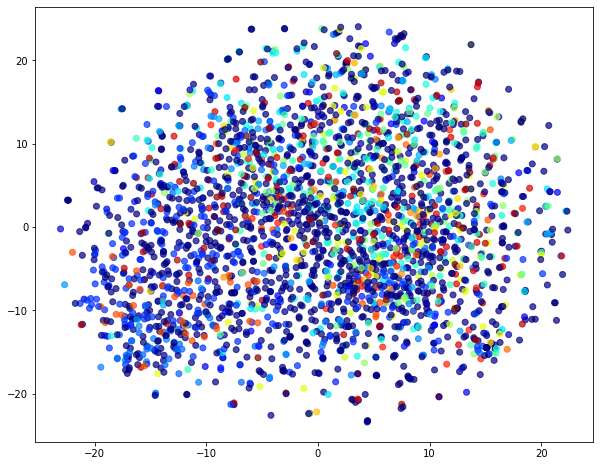

In [ ]:
alpha=0.7
fig = plt.figure(figsize=(10,8))
plt.scatter(v_pr[:,0],
            v_pr[:,1],
            c=y, cmap="jet", alpha=alpha)

# Now, with graph structure (X=A.F)

In [ ]:
tsne = TSNE(n_components=2, learning_rate='auto',init='random')
v_pr = tsne.fit_transform(X)

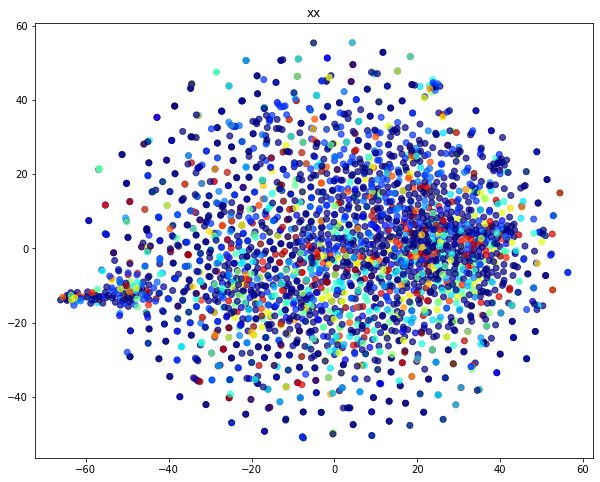

In [ ]:
alpha=0.7
fig = plt.figure(figsize=(10,8))
plt.scatter(v_pr[:,0],
            v_pr[:,1],
            c=y, cmap="jet", alpha=alpha)

In [ ]:
import itertools
matrix_dict = {}
matrix_dict['A'] = [adj]
matrix_dict['A_2'] = [adj_2]
matrix_dict['A_3'] = [adj_3]
matrix_dict['A+I'] = [adj_ego]
matrix_dict['A+I_2'] = [adj_ego_2]
matrix_dict['A+I_3'] = [adj_ego_3]
matrix_dict['A, A_2, A_3'] = [adj, adj_2, adj_3]
matrix_dict['A+I, A+I_2, A+I_3'] = [adj_ego, adj_ego_2, adj_ego_3]
matrix_dict['A, A_2, A_3, A+I, A+I_2, A+I_3'] = [adj, adj_2, adj_3, adj_ego, adj_ego_2, adj_ego_3]

In [ ]:
GCN_classification_results_with_F = {}
GCN_classification_results_without_F =  {}

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


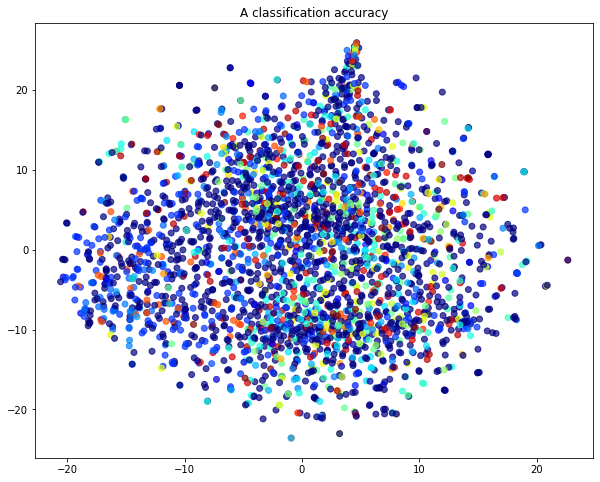

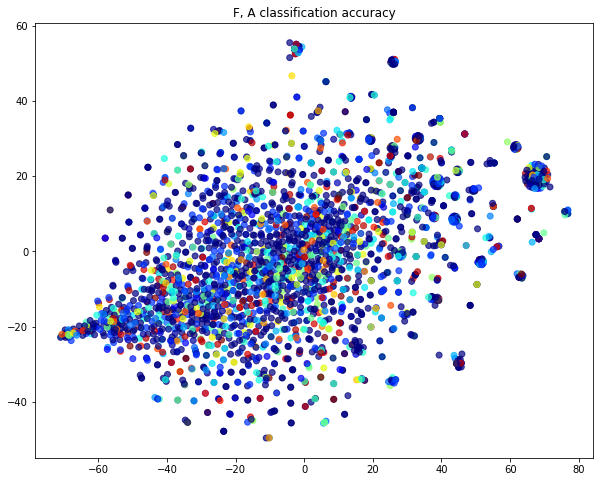

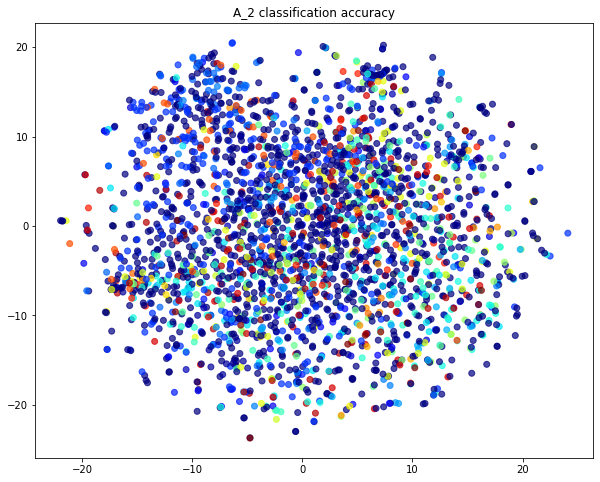

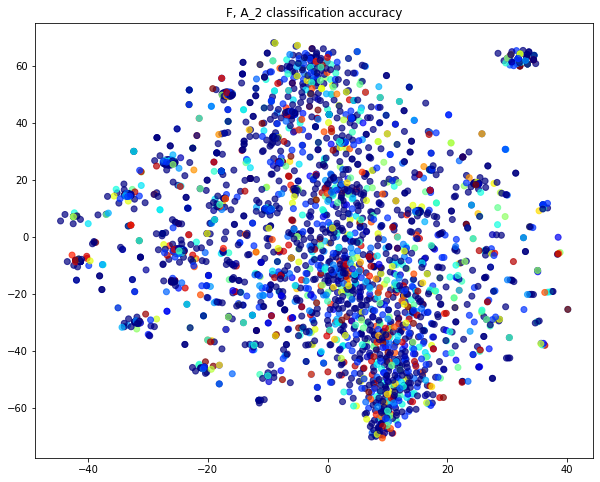

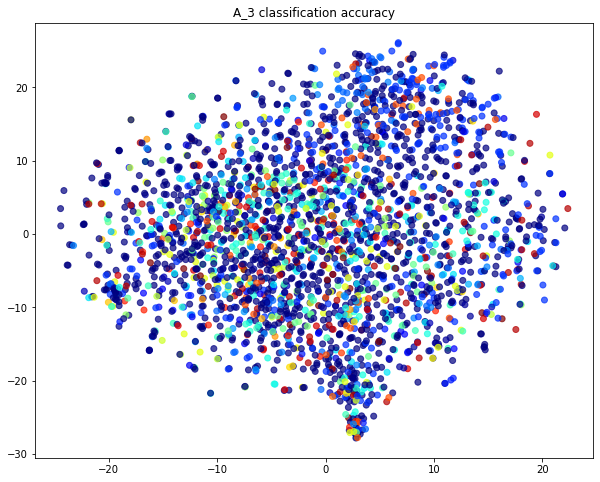

...

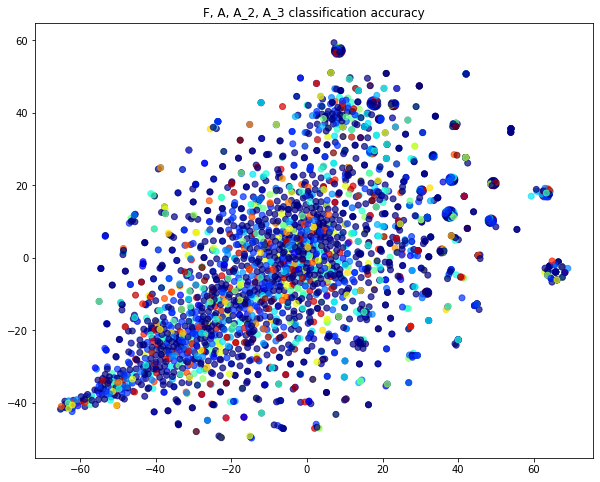

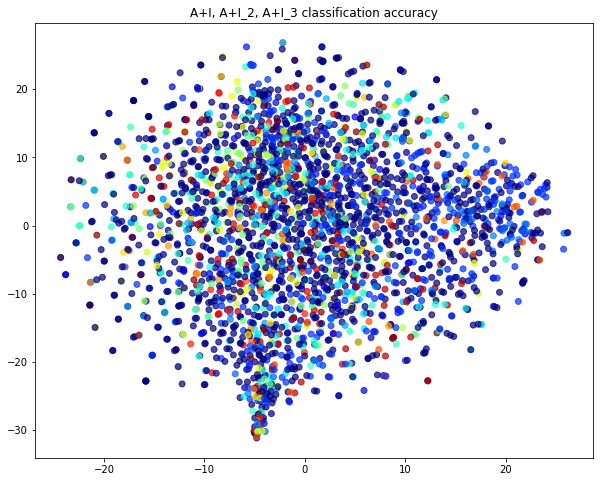

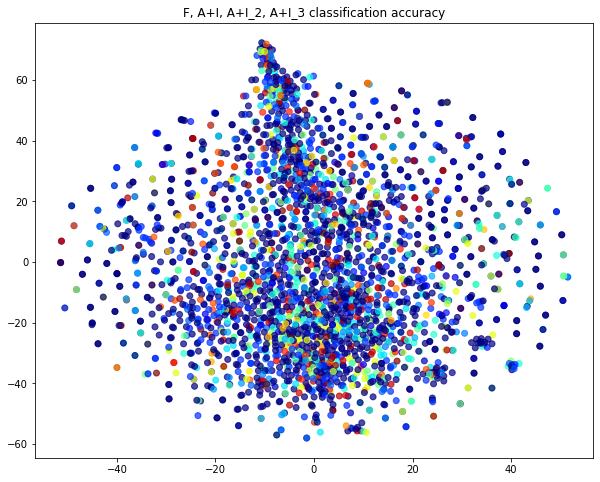

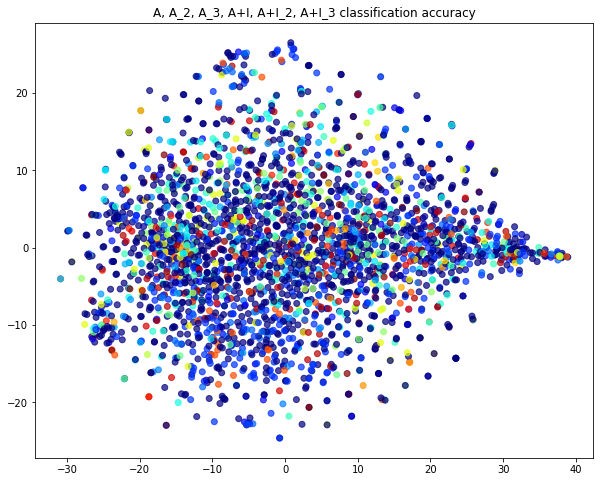

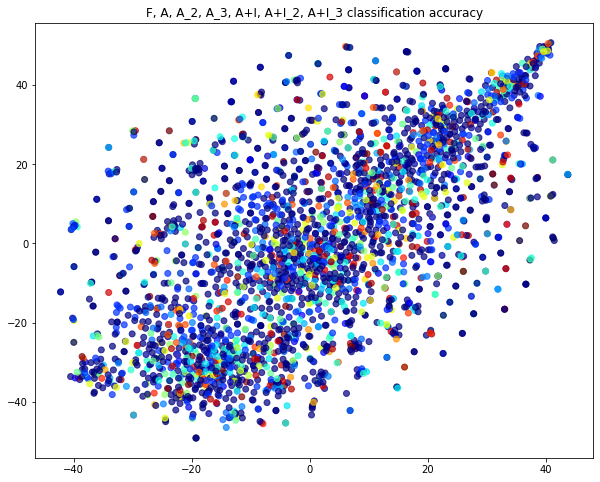

In [ ]:
for mat_key in matrix_dict.keys():
  adj_list = matrix_dict[mat_key]



  X = [F]
  for k,i in enumerate(adj_list):
    X.append(np.asarray(np.matmul(sp.csr_matrix.todense(i),F)))
  X = np.hstack(X)


  tsne = TSNE(n_components=2, learning_rate='auto',init='random')
  v_pr = tsne.fit_transform(X)
  alpha=0.7
  fig = plt.figure(figsize=(10,8))
  plt.title(mat_key + ' classification accuracy')
  plt.scatter(v_pr[:,0],
              v_pr[:,1],
              c=y, cmap="jet", alpha=alpha)
  

  clf = LogisticRegression(random_state=0)

  X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.1, random_state=42)
  clf.fit(X_train, y_train)
  GCN_classification_results_with_F['F, '+mat_key] = clf.score(X_test, y_test)


  X = []
  for k,i in enumerate(adj_list):
    X.append(np.asarray(np.matmul(sp.csr_matrix.todense(i),F)))
  X = np.hstack(X)
  
  tsne = TSNE(n_components=2, learning_rate='auto',init='random')
  v_pr = tsne.fit_transform(X)
  alpha=0.7
  fig = plt.figure(figsize=(10,8))
  plt.title('F, '+ mat_key + ' classification accuracy')
  plt.scatter(v_pr[:,0],
              v_pr[:,1],
              c=y, cmap="jet", alpha=alpha)
  

  clf = LogisticRegression(random_state=0)

  X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.1, random_state=42)
  clf.fit(X_train, y_train)
  GCN_classification_results_without_F[mat_key] = clf.score(X_test, y_test)


In [ ]:
for key, value in sorted(GCN_classification_results_with_F.items(), key=lambda x: x[1]):
    print(key, value)

F, A, A_2, A_3, A+I, A+I_2, A+I_3 0.4634246015529219
F, A+I, A+I_2, A+I_3 0.4638332652227217
F, A+I_3 0.46424192889252147
F, A, A_2, A_3 0.46424192889252147
F, A+I 0.4646505925623212
F, A_3 0.46505925623212097
F, A+I_2 0.46505925623212097
F, A 0.4662852472415202
F, A_2 0.46710257458111976


In [ ]:
for key, value in sorted(GCN_classification_results_without_F.items(), key=lambda x: x[1]):
    print(key, value)

A, A_2, A_3, A+I, A+I_2, A+I_3 0.48058847568451163
A+I, A+I_2, A+I_3 0.4846751123825092
A, A_2, A_3 0.48508377605230896
A 0.4863097670617082
A_2 0.488353085410707
A+I 0.488353085410707
A_3 0.48876174908050674
A+I_2 0.48876174908050674
A+I_3 0.48876174908050674


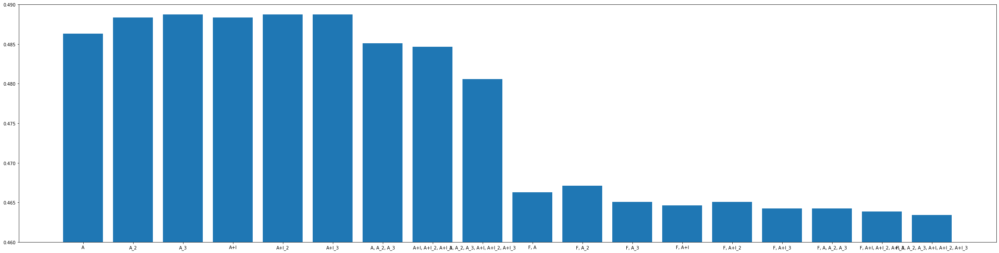

In [ ]:
import matplotlib.pyplot as plt

data = {**GCN_classification_results_without_F, **GCN_classification_results_with_F}
names = list(data.keys())
values = list(data.values())
plt.figure(figsize=(40,10))
plt.ylim(0.46,0.49)

plt.bar(range(len(data)), values, tick_label=names)
plt.show()